# This work is licensed under a Creative Commons BY 4.0 license https://creativecommons.org/licenses/by/4.0/

Copyright (c) 2022-2023, D. Kuiri, M. P. Nowak

THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS" AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE LIABLE FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

# Majorana zero modes in 2D finite SNS junction
### Isolated junction:
#### A finite SNS junction, that has a given length and width with no contacts attached, we obtain ABS spectrum and probability densities of ABS by diagonalization
### Translation invariant junction: 
#### A system finite in the direction S-N-S and invariant in the other direction - hence we can diagonalize it and obtain ABS energies dependent on k_y

In [1]:
import ipyparallel as ipp

cluster = ipp.Client()

v = cluster[:]
lview = cluster.load_balanced_view()
len(v)

40

In [2]:
%%px --local

import os

os.environ["OMP_NUM_THREADS"] = "1" # export OMP_NUM_THREADS=1
os.environ["OPENBLAS_NUM_THREADS"] = "1" # export OPENBLAS_NUM_THREADS=1 
os.environ["MKL_NUM_THREADS"] = "1" # export MKL_NUM_THREADS=1                              
os.environ["VECLIB_MAXIMUM_THREADS"] = "1" # export VECLIB_MAXIMUM_THREADS=1
os.environ["NUMEXPR_NUM_THREADS"] = "1" # export NUMEXPR_NUM_THREADS=1

In [3]:
%%px --local

import tinyarray
import kwant
import numpy as np
from matplotlib import pyplot as plt
import warnings
import scipy.constants as sc
import scipy.sparse.linalg as sla
from kwant.digest import uniform

In [4]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from adaptive import notebook_extension, Runner, Learner1D, Learner2D   
import adaptive
import pickle
import matplotlib.colors as colors
import scipy
from scipy.signal import argrelextrema
from scipy.interpolate import interp1d

notebook_extension()

## To make the isolated system

In [5]:
%%px --local

sigma_0 = np.identity(2)
sigma_x = np.array([[0, 1], [1, 0]])
sigma_y = np.array([[0, -1j], [1j, 0]])
sigma_z = np.array([[1, 0], [0, -1]])
sigma_1 = np.array([[0, 1], [0, 0]])
sigma_2 = np.array([[0, 0], [1, 0]])
sigma_0sigma_z = np.array(np.kron(sigma_0,sigma_z))
sigma_ysigma_0 = np.array(np.kron(sigma_y,sigma_0))
sigma_xsigma_z = np.array(np.kron(sigma_x,sigma_z))
sigma_ysigma_z = np.array(np.kron(sigma_y,sigma_z))
sigma_0sigma_x = np.array(np.kron(sigma_0,sigma_x))
sigma_0sigma_1 = np.array(np.kron(sigma_0,sigma_1))
sigma_0sigma_2 = np.array(np.kron(sigma_0,sigma_2))

def make_system(L_N = 80, L_SC = 400, W = 2000):  
    a = 10e-9
    m = sc.m_e*0.014
    m2 = m*10
    t = (sc.hbar**2/(2*m*a**2))/sc.eV
    tm = (sc.hbar**2/(2*m2*a**2))/sc.eV
    g = -50
    miu_B = ((sc.e*sc.hbar)/(2*sc.m_e))/sc.eV
    
    def onsite(site, B, phi, Delta, mu,alpha):         
        (x,y) = site.pos  
        if ( x < -L_N/2):
            delta = Delta
            return (2*t + 2*tm - mu)*sigma_0sigma_z + delta*sigma_0sigma_x
        
        elif (x > L_N/2):
            delta = Delta
            return (2*t + 2*tm - mu)*sigma_0sigma_z + delta*np.exp(1j*phi)*sigma_0sigma_1 + delta*np.exp(-1j*phi)*sigma_0sigma_2
        
        else:
            delta = 0
            return (4*t - mu)*sigma_0sigma_z + (g/2)*miu_B*B*sigma_ysigma_0 
        
    
    def hoppingx(site1, site2, alpha):
        (x1,y1 ) = site1.pos
        (x2,y2) = site2.pos
        x = (x1+x2)/2
        
        if (x <= L_N/2 and x >= -L_N/2): 
            return -t*sigma_0sigma_z - alpha*(1j/(2*a*1e9))*sigma_ysigma_z 
        else:
            return -t*sigma_0sigma_z  
        
                
    def hoppingy(site1, site2, alpha): 
        (x1, y1) = site1.pos
        (x2, y2) = site2.pos
        x = (x1+x2)/2
        if (x <= L_N/2 and x >= -L_N/2): 
            return -t*sigma_0sigma_z  + alpha*(1j/(2*a*1e9))*sigma_xsigma_z
        else:
            return -tm*sigma_0sigma_z 
    
    def wire(pos):
        (x,y) = pos
        return (-L_SC - L_N/2 <= x <= L_N/2 + L_SC and -W/2<=y<=W/2)
    
    lat = kwant.lattice.square(a*1e9, norbs = 4)
    syst = kwant.Builder()
    syst[lat.shape(wire, (0,0))] = onsite
    syst[kwant.builder.HoppingKind((1, 0), lat, lat)] = hoppingx
    syst[kwant.builder.HoppingKind((0, 1), lat, lat)] = hoppingy
    
    sym_top = kwant.TranslationalSymmetry((0, a*1e9 ))
    bulk_SNS = kwant.Builder(sym_top)
    bulk_SNS[lat.shape(wire, (0,0))] = onsite
    bulk_SNS[kwant.builder.HoppingKind((1, 0), lat, lat)] = hoppingx
    bulk_SNS[kwant.builder.HoppingKind((0, 1), lat, lat)] = hoppingy
    return syst, bulk_SNS

In [6]:
sys_finite, sys_infinite = make_system(L_N = 545, L_SC = 2000, W = 2000)
sysf = sys_finite.finalized()

## To plot the finite system

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/kwant/plotter.py:144: ComplexWarning: Casting complex values to real discards the imaginary part
  color = np.asarray(color, dtype=float)


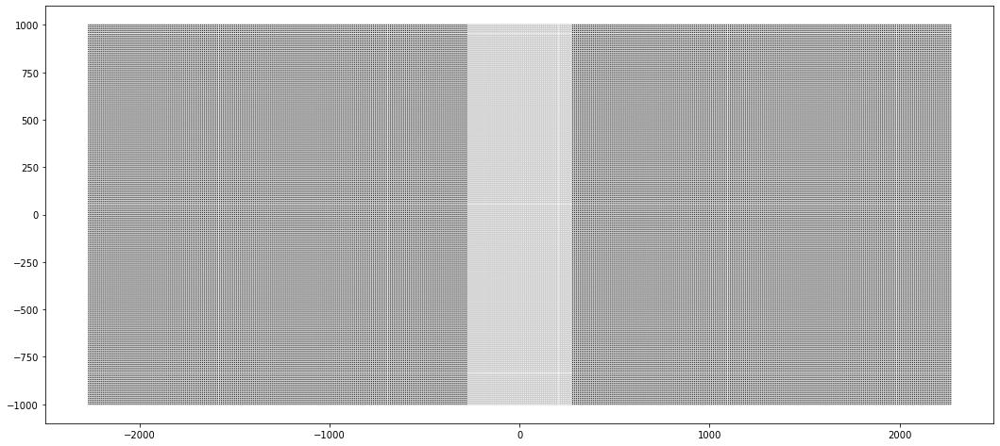

In [7]:
kwant.plotter.plot(sysf, fig_size = (18,18), colorbar = False,\
        site_color=lambda site: sysf.hamiltonian(site, site, params = dict(B = 2*1e-3, alpha = 0.05,\
                                                                           mu=3*1e-3, Delta = 1*1e-3,phi = 0))[0,0]);

## To plot the invariant system

In [8]:
syst_wrapped_SNS = kwant.wraparound.wraparound(sys_infinite, coordinate_names= "yaa").finalized()

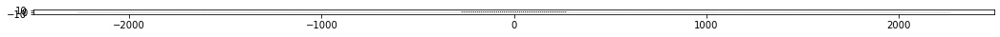

In [9]:
kwant.plotter.plot(syst_wrapped_SNS, fig_size = (18,18), colorbar = False,\
        site_color=lambda site: syst_wrapped_SNS.hamiltonian(site, site, params = dict(B = 2*1e-3, alpha = 0.05,\
                                                                           mu=5*1e-3, Delta = .2*1e-3,phi = 0, k_y =0))[0,0]);

## Energy calculation for closed system

In [10]:
%%px --local

def energy(L_N, L_SC, W, mu, Delta, alpha, B, phi, n_values, return_eigenvectors = False):
    class LuInv(sla.LinearOperator):
        def __init__(self, A):
            inst = kwant.linalg.mumps.MUMPSContext()
            inst.factor(A, ordering='metis')
            self.solve = inst.solve
            try:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype,
                                            matvec=self._matvec)
            except TypeError:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype)

        def _matvec(self, x):
            return self.solve(x.astype(self.dtype))

    n_eigs = n_values
    n_vec_lanczos = 3*n_values+10
    sigma=0.0
    
    sys_finite, sys_infinite = make_system(L_N = L_N, L_SC = L_SC,W=W)
    sysf = sys_finite.finalized()
    ham_mat = sysf.hamiltonian_submatrix(params=dict(mu = mu, Delta = Delta, alpha = alpha, B = B, phi = phi),\
                                         sparse=True)
    ev, evecs = sla.eigs(ham_mat, k=n_eigs, OPinv=LuInv(ham_mat), sigma=sigma, ncv=n_vec_lanczos,\
                  return_eigenvectors=True)

    ev_sorting_indices = ev.argsort()
    

    ev = ev[ev_sorting_indices]
    evecs = np.array(evecs)[:,ev_sorting_indices]
    
    if (return_eigenvectors):
        return ev, evecs
    else:
        return ev

## Calculation of positive energy spectrum

In [11]:
%%px --local

def energy_positive(L_N, L_SC, W, mu, Delta, alpha, B, phi, n_values, return_eigenvectors = False):
    class LuInv(sla.LinearOperator):
        def __init__(self, A):
            inst = kwant.linalg.mumps.MUMPSContext()
            inst.factor(A, ordering='metis')
            self.solve = inst.solve
            try:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype,
                                            matvec=self._matvec)
            except TypeError:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype)

        def _matvec(self, x):
            return self.solve(x.astype(self.dtype))

    n_eigs = n_values
    n_vec_lanczos = 3*n_values+10
    sigma=0.0
    
    sys_finite, sys_infinite = make_system(L_N = L_N, L_SC = L_SC,W=W)
    sysf = sys_finite.finalized()
    ham_mat = sysf.hamiltonian_submatrix(params=dict(mu = mu, Delta = Delta, alpha = alpha, B = B, phi = phi),\
                                         sparse=True)
    ev, evecs = sla.eigs(ham_mat, k=n_eigs, OPinv=LuInv(ham_mat), sigma=sigma, ncv=n_vec_lanczos,\
                  return_eigenvectors=True)

    ev_sorting_indices = ev.argsort()
    

    ev = ev[ev_sorting_indices]
    evecs = np.array(evecs)[:,ev_sorting_indices]
    
    positive_indices = np.where(ev > 0)[0]
    
    if (return_eigenvectors):
        return ev[positive_indices], evecs[:,positive_indices]
    else:
        return ev[positive_indices]

## $B_{plane} =0$ 

In [ ]:
phi_values1 = np.linspace( - 4*np.pi, 4*np.pi, 400)
res_B_0_positive = lview.map_async(lambda phi: energy_positive(L_N = 80, L_SC = 2000, W = 2000, mu=5*1e-3, Delta = 0.2*1e-3,\
                                                               alpha = 50*1e-3,B = 0, phi = phi, n_values = 200,\
                                                               return_eigenvectors = False), phi_values1)
res_B_0_positive.wait_interactive()
energies_with_phi_B_0_positive = res_B_0_positive.get()

In [562]:
with open('energies_with_phi_B_0_positive.pkl', 'wb') as energies_with_phi_B_0_positive_pickle:     
    pickle.dump(energies_with_phi_B_0_positive, energies_with_phi_B_0_positive_pickle)

In [12]:
with open('energies_with_phi_B_0_positive.pkl', 'rb') as energies_with_phi_B_0_positive_pickle:    
     Pickle_energies_with_phi_B_0_positive = pickle.load( energies_with_phi_B_0_positive_pickle)

In [13]:
phi_values1 = np.linspace( - 4*np.pi, 4*np.pi, 400)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


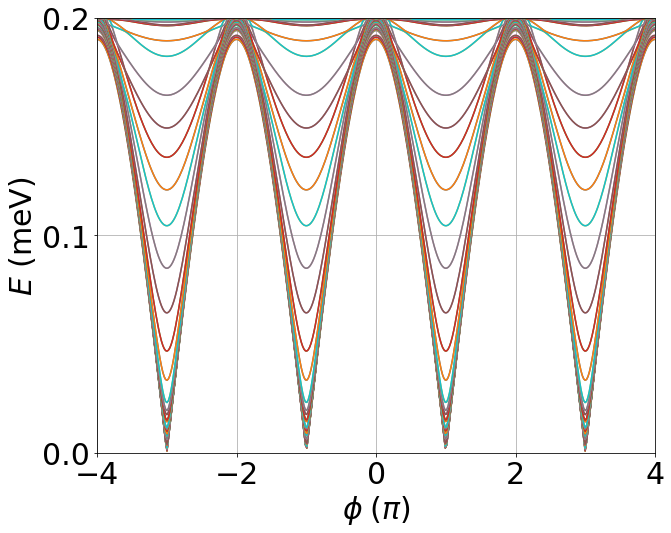

In [14]:
plt.figure(figsize = (10,8))
plt.plot(phi_values1/np.pi, np.array(Pickle_energies_with_phi_B_0_positive)*1e3)
plt.xlabel("$\phi\;(\pi)$", fontsize=30)
plt.ylabel("$E$ (meV)", fontsize=30)
plt.ylim(0,0.2)
plt.xlim(-4,4)
plt.yticks([0, 0.1, 0.2]);
plt.tick_params(labelsize=30)
plt.grid()
plt.tick_params(labelsize=30)

### $B_{plane} = 0.5$T

In [ ]:
phi_values1 = np.linspace( - 4*np.pi, 4*np.pi, 400)
res_B_05_positive = lview.map_async(lambda phi: energy_positive(L_N = 80, L_SC = 2000, W = 2000, mu=5*1e-3, \
                                                                Delta = 0.2*1e-3, alpha = 50*1e-3,B = 0.5, phi = phi, \
                                                                n_values = 200, return_eigenvectors = False), phi_values1)
res_B_05_positive.wait_interactive()
energies_with_phi_B_05_positive = res_B_05_positive.get()

   0/400 tasks finished after 3692 s

In [25]:
with open('energies_with_phi_B_05_positive.pkl', 'wb') as energies_with_phi_B_05_positive_pickle:  
    pickle.dump(energies_with_phi_B_05_positive, energies_with_phi_B_05_positive_pickle)

In [15]:
with open('energies_with_phi_B_05_positive.pkl', 'rb') as energies_with_phi_B_05_positive_pickle:    
     Pickle_energies_with_phi_B_05_positive = pickle.load( energies_with_phi_B_05_positive_pickle)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


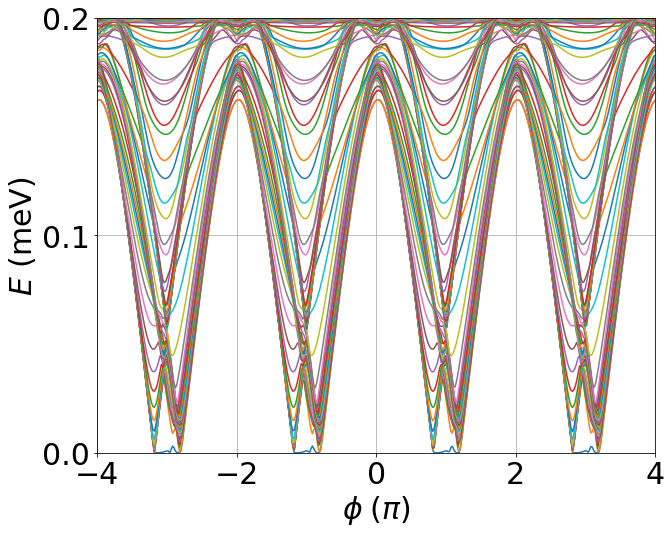

In [16]:
plt.figure(figsize = (10,8))
plt.plot(phi_values1/np.pi, np.array(Pickle_energies_with_phi_B_05_positive)*1e3)
plt.xlabel("$\phi\;(\pi)$", fontsize=30)
plt.ylabel("$E$ (meV)", fontsize=30)
plt.ylim(0,0.2)
plt.xlim(-4,4)
plt.yticks([0, 0.1, 0.2]);
plt.tick_params(labelsize=30)
plt.grid()
plt.tick_params(labelsize=30)

## $B_{plane} = 1T$

In [ ]:
phi_values1 = np.linspace( - 4*np.pi, 4*np.pi, 400)
res_B_1_positive = lview.map_async(lambda phi: energy_positive(L_N = 80, L_SC = 2000, W = 2000, mu=5*1e-3, Delta = 0.2*1e-3,\
                                                               alpha = 50*1e-3, B = 1, phi = phi, n_values = 200,\
                                                               return_eigenvectors = False), phi_values1)
res_B_1_positive.wait_interactive()
energies_with_phi_B_1_positive = res_B_1_positive.get()

In [558]:
with open('energies_with_phi_B_1_positive.pkl', 'wb') as energies_with_phi_B_1_positive_pickle:     
    pickle.dump(energies_with_phi_B_1_positive, energies_with_phi_B_1_positive_pickle)

In [17]:
with open('energies_with_phi_B_1_positive.pkl', 'rb') as energies_with_phi_B_1_positive_pickle:    
     Pickle_energies_with_phi_B_1_positive = pickle.load( energies_with_phi_B_1_positive_pickle)

In [18]:
phi_values_new = np.linspace(- 4*np.pi, 4*np.pi, 400)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


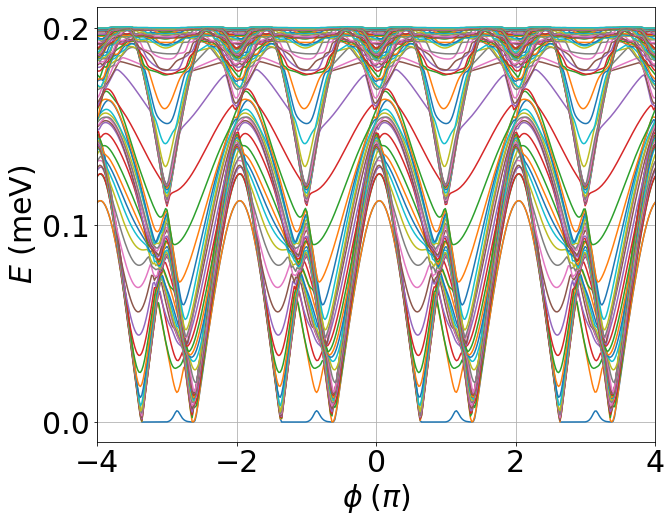

In [19]:
plt.figure(figsize = (10,8))
plt.plot(phi_values_new/np.pi, np.array(Pickle_energies_with_phi_B_1_positive)*1e3)
plt.xlabel("$\phi\;(\pi)$", fontsize=30)
plt.ylabel("$E$ (meV)", fontsize=30)
plt.xlim(-4,4)
plt.yticks([0, 0.1, 0.2]);
plt.tick_params(labelsize=30)
plt.grid()
plt.tick_params(labelsize=30)
plt.show()

## Calculation of supercurrent,   $I_{s} = -\frac{e}{\hbar} \sum_{E_{i}>0} {\frac{\partial E_i}{\partial \Phi}}$ 

### For $B_{plane} = 0$ T

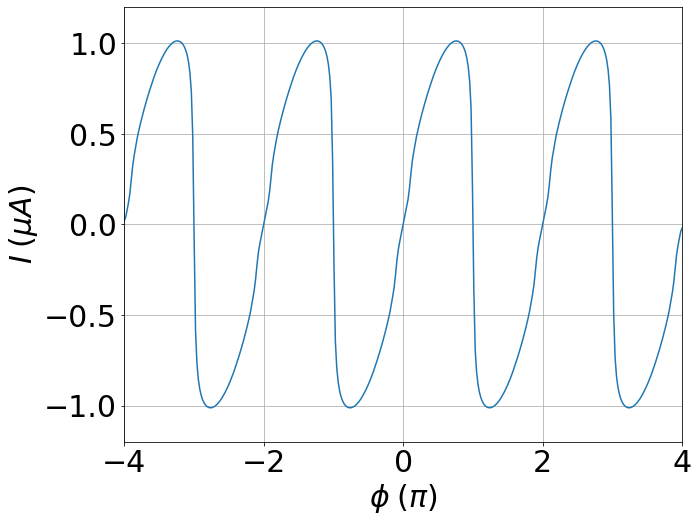

In [22]:
plt.figure(figsize = (10,8))
e_B_0 = np.array(Pickle_energies_with_phi_B_0_positive)*sc.eV
I_s_B_0 = -(sc.e/sc.hbar)*np.sum(np.gradient(e_B_0[:,:],phi_values_new, axis = 0), axis = 1)
plt.plot(phi_values_new/np.pi, np.real(I_s_B_0)*1e6)
plt.xlabel("$\phi\;(\pi)$", fontsize=30)
plt.ylabel("$I\; (\mu A)$", fontsize=30)
plt.ylim(-1.2,1.2)
plt.xlim(-4,4)
plt.tick_params(labelsize=30)
plt.grid()
plt.show()

### For $B_{plane} = 0.5$ T

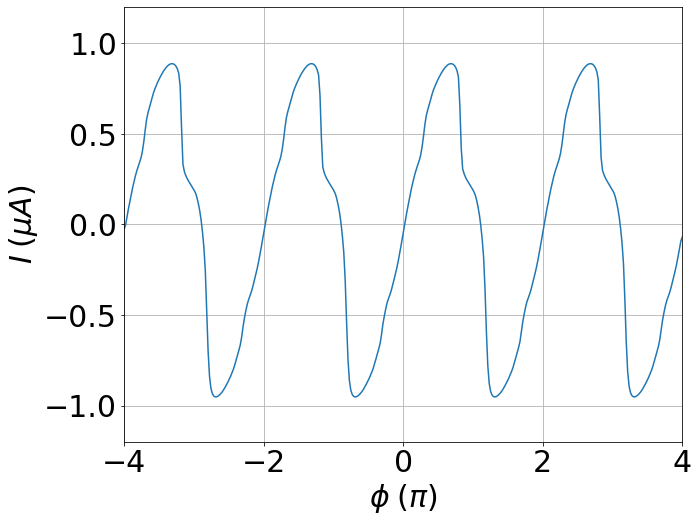

In [23]:
plt.figure(figsize = (10,8))
e_B_05 = np.array(Pickle_energies_with_phi_B_05_positive)*sc.eV
I_s_B_05 = -(sc.e/sc.hbar)*np.sum(np.gradient(e_B_05[:,:],phi_values_new, axis = 0), axis = 1)
plt.plot(phi_values_new/np.pi, np.real(I_s_B_05)*1e6)
plt.xlabel("$\phi\;(\pi)$", fontsize=30)
plt.ylabel("$I\; (\mu A)$", fontsize=30)
plt.ylim(-1.2,1.2)
plt.xlim(-4,4)
plt.tick_params(labelsize=30)
plt.grid()
plt.show()

## For $B_{plane} = 1$ T

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


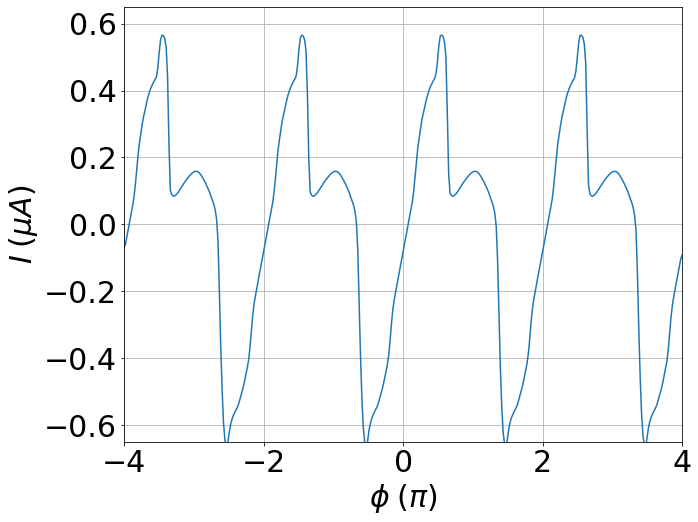

In [24]:
plt.figure(figsize = (10,8))
phase_value = np.linspace( -4*np.pi, 4*np.pi, 400)
e_B_1 = np.array(Pickle_energies_with_phi_B_1_positive)*sc.eV
I_s_B_1 = -(sc.e/sc.hbar)*np.sum(np.gradient(e_B_1[:,:],phi_values_new, axis = 0), axis = 1)
plt.plot(phi_values_new/np.pi, I_s_B_1*1e6)
plt.xlabel("$\phi\;(\pi)$", fontsize=30)
plt.ylabel("$I\; (\mu A)$", fontsize=30)
plt.ylim(-0.65,0.65)
plt.xlim(-4,4)
plt.tick_params(labelsize=30)
plt.grid()
plt.show()

# Numerical flux to phase conversion for $B_{plane} = 0$
#### Initially, we have to interpolate the numerical data of energy and current into function and thereafter, we can replace it in the following equation

In [25]:
phi_values = np.linspace(-4*np.pi, 4*np.pi, 400)

In [26]:
def interpolation_E_phi_B_plane_0(phi):
    phase = phi_values
    E_phi = np.sum(e_B_0[:,:],axis = 1)
    interpol = interp1d(phase, E_phi)
    
    return interpol(np.mod(phi,2*np.pi))

In [27]:
def interpolation_I_phi_B_plane_0(phi):
    phase = phi_values
    I_phi = np.real(I_s_B_0)
    interpol = interp1d(phase, I_phi)
    
    return interpol(np.mod(phi,2*np.pi))

In [28]:
def fluxphase_B_plane_0(phi, flux, beta):
    return beta*interpolation_I_phi_B_plane_0(phi = phi) + phi - 2*np.pi*flux

In [29]:
%%px --local

phi_min_B_plane_0 = []
all_phases_B_plnae_0 = []
def calculate_flux_to_phase_B_plane_0(B_values, L = 321*1e-12, R = 4207*1e-9):
    all_phases = []
    flux_quanta = (sc.hbar*np.pi)/sc.e
    beta = (2*np.pi*L)/flux_quanta
    flux = (B_values*np.pi*R*R)/flux_quanta    
    for iB, B in enumerate(B_values):
        roots = []
        for x0 in np.linspace(-200,200, 600):
            y = scipy.optimize.root(fluxphase_B_plane_0, x0, args = (flux[iB], beta))
            if y.success and (round(y.x[0], 8) not in roots):
                roots.append(round(y.x[0], 8))
        all_phases.append(np.resize(roots, 3))
        
    
    phases_energy_minimalization = []

    for iB, B in enumerate(B_values):
        roots = []

        for x0 in np.linspace(-200,200,600):
            y = scipy.optimize.root(fluxphase_B_plane_0, x0, args = (flux[iB], beta))
            if y.success and (round(y.x[0], 7) not in roots):
                roots.append(round(y.x[0], 7))

        energies = []
        for phase in roots:
            energy = -interpolation_E_phi_B_plane_0(phi = phase)
            energy += 0.5*L*interpolation_I_phi_B_plane_0(phi = phase)**2
            energies.append(energy)

            min_index = np.argmin(energies)    

        phases_energy_minimalization.append(roots[min_index])
    
    return phi_min_B_plane_0.append(np.array(phases_energy_minimalization)), all_phases_B_plnae_0.append(np.array(all_phases))

In [33]:
B_values = np.linspace(-70,70,600)*1e-6

In [147]:
calculate_flux_to_phase_B_plane_0(B_values)

(None, None)

In [148]:
with open('phi_min_B_plane_0.pkl', 'wb') as phi_min_B_plane_0_pickle:    
    pickle.dump(phi_min_B_plane_0, phi_min_B_plane_0_pickle)

In [149]:
with open('all_phases_B_plane_0.pkl', 'wb') as all_phases_B_plane_0_pickle:     
    pickle.dump(all_phases_B_plane_0, all_phases_B_plane_0_pickle)

In [30]:
with open('phi_min_B_plane_0.pkl', 'rb') as phi_min_B_plane_0_pickle:    
     Pickle_phi_min_B_plane_0 = pickle.load(phi_min_B_plane_0_pickle)

In [82]:
with open('all_phases_B_plane_0.pkl', 'rb') as all_phases_B_plane_0_pickle:    
     Pickle_all_phases_B_plane_0 = pickle.load(all_phases_B_plane_0_pickle)

## Figure 6(a)

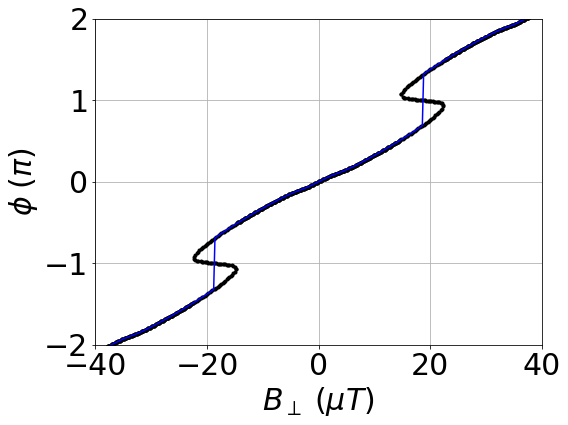

In [34]:
plt.figure(figsize=(8,6))
plt.plot(B_values*1e6, np.array(Pickle_all_phases_B_plnae_0).reshape(600, 3)/np.pi, "k.")
plt.plot(B_values*1e6, np.array(Pickle_phi_min_B_plane_0).flatten()/np.pi, "b-") 
plt.ylabel("$\phi\;(\pi)$", fontsize = 30)
plt.xlabel("$B_{\perp}\;(\mu T)$", fontsize = 30)
plt.xlim(-40,40)
plt.ylim(-2,2)
plt.tick_params(labelsize=30)
plt.grid()
plt.show()

# Numerical flux to phase conversion for $B_{plane} = 0.5$ T
#### Initially, we have to interpolate the numerical data of energy and current into function and thereafter, we can replace it in the following equation

In [35]:
def interpolation_E_phi_B_05(phi):
    phase = phi_values
    E_phi = np.sum(e_B_05[:,:],axis = 1)
    interpol = interp1d(phase, E_phi)
    
    return interpol(np.mod(phi,2*np.pi))

In [36]:
def interpolation_I_phi_B_05(phi):
    phase = phi_values
    I_phi = np.real(I_s_B_05)
    interpol = interp1d(phase, I_phi)
    
    return interpol(np.mod(phi,2*np.pi))

In [37]:
def fluxphase_B_05(phi, flux, beta):
    return beta*interpolation_I_phi_B_05(phi = phi) + phi - 2*np.pi*flux

In [38]:
phi_min_B_plane_05 = []
all_phases_B_plnae_05 = []
def calculate_flux_to_phase_B_plane_05(B_values, L = 321*1e-12, R = 4207*1e-9):
    all_phases = []
    flux_quanta = (sc.hbar*np.pi)/sc.e
    beta = (2*np.pi*L)/flux_quanta
    flux = (B_values*np.pi*R*R)/flux_quanta    
    for iB, B in enumerate(B_values):
        roots = []
        for x0 in np.linspace(-200,200, 600):
            y = scipy.optimize.root(fluxphase_B_05, x0, args = (flux[iB], beta))
            if y.success and (round(y.x[0], 8) not in roots):
                roots.append(round(y.x[0], 8))
        all_phases.append(np.resize(roots, 3))
        
    
    phases_energy_minimalization = []

    for iB, B in enumerate(B_values):
        roots = []

        for x0 in np.linspace(-200,200,600):
            y = scipy.optimize.root(fluxphase_B_05, x0, args = (flux[iB], beta))
            if y.success and (round(y.x[0], 7) not in roots):
                roots.append(round(y.x[0], 7))

        energies = []
        for phase in roots:
            energy = -interpolation_E_phi_B_05(phi = phase)
            energy += 0.5*L*interpolation_I_phi_B_05(phi = phase)**2
            energies.append(energy)

            min_index = np.argmin(energies)    

        phases_energy_minimalization.append(roots[min_index])
    
    return phi_min_B_plane_05.append(np.array(phases_energy_minimalization)), all_phases_B_plnae_05.append(np.array(all_phases))

In [168]:
B_values = np.linspace(-70,70,600)*1e-6
calculate_flux_to_phase_B_plane_05(B_values)

(None, None)

In [169]:
with open('phi_min_B_plane_05.pkl', 'wb') as phi_min_B_plane_05_pickle:    
    pickle.dump(phi_min_B_plane_05, phi_min_B_plane_05_pickle)

In [170]:
with open('all_phases_B_plnae_05.pkl', 'wb') as all_phases_B_plnae_05_pickle:     
    pickle.dump(all_phases_B_plnae_05, all_phases_B_plnae_05_pickle)

In [39]:
with open('phi_min_B_plane_05.pkl', 'rb') as phi_min_B_plane_05_pickle:    
     Pickle_phi_min_B_plane_05 = pickle.load(phi_min_B_plane_05_pickle)

In [83]:
with open('all_phases_B_plane_05.pkl', 'rb') as all_phases_B_plane_05_pickle:    
     Pickle_all_phases_B_plane_05 = pickle.load(all_phases_B_plane_05_pickle)

## Figure 6(b)

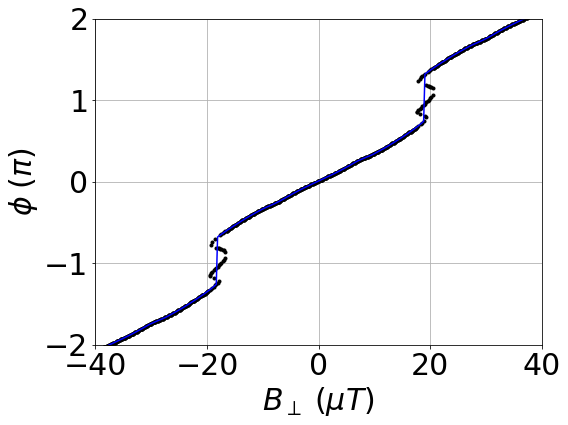

In [41]:
plt.figure(figsize=(8,6))
plt.plot(B_values*1e6, np.array(Pickle_all_phases_B_plnae_05).reshape(600, 3)/np.pi, "k.")
plt.plot(B_values*1e6, np.array(Pickle_phi_min_B_plane_05).flatten()/np.pi, "b-") 
plt.ylabel("$\phi\;(\pi)$", fontsize = 30)
plt.xlabel("$B_{\perp}\;(\mu T)$", fontsize = 30)
plt.xlim(-40,40)
plt.ylim(-2,2)
plt.tick_params(labelsize=30)
plt.grid()
plt.show()

## Numerical flux to phase conversion for $B_{plane} = 1$ T
#### Initially, we have to interpolate the numerical data of energy and current into function and thereafter, we can replace it in the following equation

In [42]:
def interpolation_E_phi_B_plane_1(phi):
    phase = phi_values
    E_phi = np.sum(e_B_1[:,:],axis = 1)
    interpol = interp1d(phase, E_phi)
    
    return interpol(np.mod(phi,2*np.pi))

In [43]:
def interpolation_E_phi_B_plane_1(phi):
    phase = phi_values
    I_phi = np.real(I_s_B_1)
    interpol = interp1d(phase, I_phi)
    
    return interpol(np.mod(phi,2*np.pi))

In [44]:
def fluxphase_B_plane_1(phi, flux, beta):
    return beta*interpolation_E_phi_B_plane_1(phi = phi) + phi - 2*np.pi*flux

In [45]:
phi_min_B_plane_1 = []
all_phases_B_plnae_1 = []
def calculate_flux_to_phase_B_plane_1(B_values, L = 321*1e-12, R = 4207*1e-9):
    all_phases = []
    flux_quanta = (sc.hbar*np.pi)/sc.e
    beta = (2*np.pi*L)/flux_quanta
    flux = (B_values*np.pi*R*R)/flux_quanta    
    for iB, B in enumerate(B_values):
        roots = []
        for x0 in np.linspace(-200,200, 600):
            y = scipy.optimize.root(fluxphase_B_plane_1, x0, args = (flux[iB], beta))
            if y.success and (round(y.x[0], 8) not in roots):
                roots.append(round(y.x[0], 8))
        all_phases.append(np.resize(roots, 3))
        
    
    phases_energy_minimalization = []

    for iB, B in enumerate(B_values):
        roots = []

        for x0 in np.linspace(-200,200,600):
            y = scipy.optimize.root(fluxphase_B_plane_1, x0, args = (flux[iB], beta))
            if y.success and (round(y.x[0], 7) not in roots):
                roots.append(round(y.x[0], 7))

        energies = []
        for phase in roots:
            energy = -interpolation_E_phi_B_plane_1(phi = phase)
            energy += 0.5*L*interpolation_E_phi_B_plane_1(phi = phase)**2
            energies.append(energy)

            min_index = np.argmin(energies)    

        phases_energy_minimalization.append(roots[min_index])
    
    return phi_min_B_plane_1.append(np.array(phases_energy_minimalization)), all_phases_B_plnae_1.append(np.array(all_phases))

In [157]:
B_values = np.linspace(-70,70,600)*1e-6
calculate_flux_to_phase_B_plane_1(B_values)

(None, None)

In [159]:
with open('phi_min_B_plane_1.pkl', 'wb') as phi_min_B_plane_1_pickle:    
    pickle.dump(phi_min_B_plane_1, phi_min_B_plane_1_pickle)

In [160]:
with open('all_phases_B_plnae_1.pkl', 'wb') as all_phases_B_plnae_1_pickle:     
    pickle.dump(all_phases_B_plnae_1, all_phases_B_plnae_1_pickle)

In [46]:
with open('phi_min_B_plane_1.pkl', 'rb') as phi_min_B_plane_1_pickle:    
     Pickle_phi_min_B_plane_1 = pickle.load(phi_min_B_plane_1_pickle)

In [84]:
with open('all_phases_B_plane_1.pkl', 'rb') as all_phases_B_plane_1_pickle:    
     Pickle_all_phases_B_plane_1 = pickle.load(all_phases_B_plane_1_pickle)

## Figure 6(c)

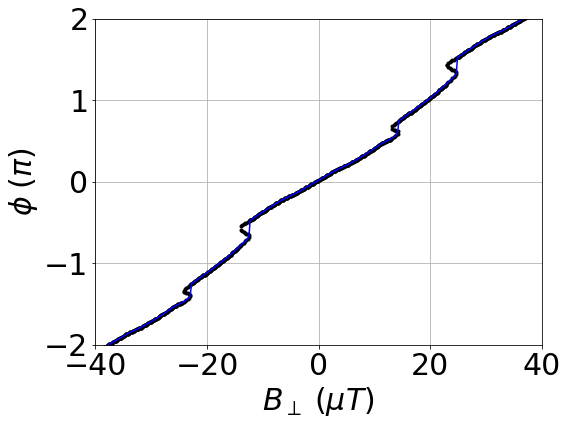

In [48]:
plt.figure(figsize=(8,6))
plt.plot(B_values*1e6, np.array(Pickle_all_phases_B_plnae_1).reshape(600, 3)/np.pi, "k.")
plt.plot(B_values*1e6, np.array(Pickle_phi_min_B_plane_1).flatten()/np.pi, "b-") 
plt.ylabel("$\phi\;(\pi)$", fontsize = 30)
plt.xlabel("$B_{\perp}\;(\mu T)$", fontsize = 30)
plt.xlim(-40,40)
plt.ylim(-2,2)
plt.tick_params(labelsize=30)
plt.grid()
plt.show()

## Calculation of energy for wrapped system

In [49]:
%%px --local

def energy_ky(L_N, L_SC, W, mu, Delta, alpha, B, phi,k_y, n_values, return_eigenvectors = False):
    class LuInv(sla.LinearOperator):
        def __init__(self, A):
            inst = kwant.linalg.mumps.MUMPSContext()
            inst.factor(A, ordering='metis')
            self.solve = inst.solve
            try:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype,
                                            matvec=self._matvec)
            except TypeError:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype)

        def _matvec(self, x):
            return self.solve(x.astype(self.dtype))

    n_eigs = n_values
    n_vec_lanczos = 3*n_values+10
    sigma=0.0
    
    sys_finite, sys_infinite = make_system(L_N = L_N, L_SC = L_SC,W=W)
    syst_wrapped_SNS = kwant.wraparound.wraparound(sys_infinite, coordinate_names= "yaa").finalized()
    ham_mat = syst_wrapped_SNS.hamiltonian_submatrix(params=dict(mu = mu, Delta = Delta, alpha = alpha, B = B,\
                                                                 phi = phi, k_y =k_y),sparse=True)
    ev, evecs = sla.eigs(ham_mat, k=n_eigs, OPinv=LuInv(ham_mat), sigma=sigma, ncv=n_vec_lanczos,\
                  return_eigenvectors=True)

    ev_sorting_indices = ev.argsort()
    

    ev = ev[ev_sorting_indices]
    evecs = np.array(evecs)[:,ev_sorting_indices]
    
    if (return_eigenvectors):
        return ev, evecs
    else:
        return ev

## Polarisation for wrapped system

In [50]:
%%px --local

def Polarisation_for_wrapped_system(L_N, L_SC, W, mu, Delta, alpha, B, phi, k_y, n_values):
    class LuInv(sla.LinearOperator):
        def __init__(self, A):
            inst = kwant.linalg.mumps.MUMPSContext()
            inst.factor(A, ordering='metis')
            self.solve = inst.solve
            try:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype,
                                            matvec=self._matvec)
            except TypeError:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype)

        def _matvec(self, x):
            return self.solve(x.astype(self.dtype))

    n_eigs = n_values
    n_vec_lanczos = 3*n_values+10
    sigma=0.0
    
    sys_finite, sys_infinite = make_system(L_N = L_N, L_SC = L_SC,W=W)
    syst_wrapped_SNS = kwant.wraparound.wraparound(sys_infinite, coordinate_names= "yaa").finalized()
    ham_mat = syst_wrapped_SNS.hamiltonian_submatrix(params=dict(mu = mu, Delta = Delta, alpha = alpha, B = B,\
                                                                 phi = phi, k_y =k_y),sparse=True)
    ev, evecs = sla.eigs(ham_mat, k=n_eigs, OPinv=LuInv(ham_mat), sigma=sigma, ncv=n_vec_lanczos)
    ev_sorting_indices = ev.argsort()
    ev = ev[ev_sorting_indices]
    evecs = np.array(evecs)[:,ev_sorting_indices]
    ee = np.real(ev)
    x = []
    y = []
    for ie, e in enumerate(np.array(ee)):

        wf_e_up = evecs[::4,ie]
        wf_h_do = evecs[1::4,ie]
        wf_e_do = evecs[2::4,ie]
        wf_h_up = evecs[3::4,ie]

        ch_e_up = np.sum(np.abs(wf_e_up)**2)
        ch_h_do = np.sum(np.abs(wf_h_do)**2)
        ch_e_do = np.sum(np.abs(wf_e_do)**2)
        ch_h_up = np.sum(np.abs(wf_h_up)**2)
        Q_e = (ch_e_up + ch_e_do)
        Q_h = (ch_h_up + ch_h_do)
        P = (Q_e - Q_h)/ (Q_e + Q_h)
        x.append(e)
        y.append(P)
    return x,y

In [52]:
%%px --local

L_N= 80
L_SC = 2000
W = 2000
mu = 5
Delta = 0.2
alpha = 50
B = 0.5
n_values = 12
phi = 0.84*np.pi

In [53]:
ky_values_new = np.linspace( -1, 1, 400)

In [271]:
ky_values_new = np.linspace( -1, 1, 400)
res_phi_084pi_B_05_ky_1 = lview.map_async(lambda k_y: Polarisation_for_wrapped_system(L_N = L_N, L_SC = L_SC, W = W, mu=mu*1e-3, Delta = Delta*1e-3, alpha = alpha*1e-3,\
                                         B = B, phi = phi, k_y = k_y, n_values = n_values), ky_values_new)
res_phi_084pi_B_05_ky_1 .wait_interactive()
energies_with_k_y_for_084pi_B_05_ky_1_scatter = res_phi_084pi_B_05_ky_1.get()

 400/400 tasks finished after   41 s
done


In [272]:
with open('energies_with_k_y_for_084pi_B_05_ky_1_scatter.pkl', 'wb') as energies_with_k_y_for_084pi_B_05_ky_1_scatter_pickle:     # wt means: write tinary
    pickle.dump(energies_with_k_y_for_084pi_B_05_ky_1_scatter, energies_with_k_y_for_084pi_B_05_ky_1_scatter_pickle)

In [54]:
with open('energies_with_k_y_for_084pi_B_05_ky_1_scatter.pkl', 'rb') as energies_with_k_y_for_084pi_B_05_ky_1_scatter_pickle:    
    Pickle_energies_with_k_y_for_084pi_B_05_ky_1_scatter = pickle.load(energies_with_k_y_for_084pi_B_05_ky_1_scatter_pickle)

In [55]:
velocity_k_y_for_084pi_B_05_ky_1_real_params \
        = np.gradient((np.array(Pickle_energies_with_k_y_for_084pi_B_05_ky_1_scatter))[:,0,:], axis = 0).ravel()

In [56]:
E_k_y_for_084pi_B_05_ky_1_real_params = np.array(Pickle_energies_with_k_y_for_084pi_B_05_ky_1_scatter)[0:,0:1, :].ravel()
Pol_k_y_for_084pi_B_05_ky_1_real_params = np.array(Pickle_energies_with_k_y_for_084pi_B_05_ky_1_scatter)[0:,1:2, :].ravel()

In [57]:
K_y_pi_for_084pi_B_05_ky_1 = np.repeat(ky_values_new,12)

In [58]:
ky = K_y_pi_for_084pi_B_05_ky_1

In [59]:
E_k = E_k_y_for_084pi_B_05_ky_1_real_params

## Figure 3(a)

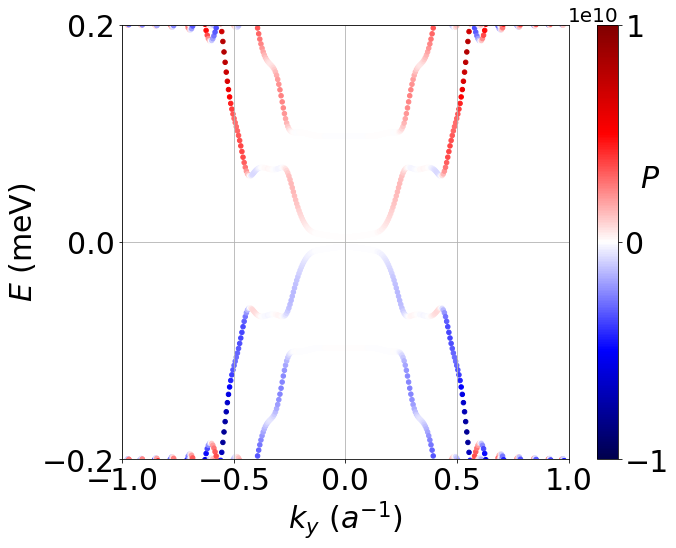

In [60]:
fig = plt.figure(figsize=(10,8))
hbar_eV = sc.hbar/sc.eV
c_fact = 1/hbar_eV
norm = colors.TwoSlopeNorm(vcenter=0, vmin = -1*1e10, vmax = 1*1e10)
plt.scatter(ky, E_k*1e3, s = 20, c=c_fact*velocity_k_y_for_084pi_B_05_ky_1_real_params*ky, cmap="seismic", norm = norm)
cbar = plt.colorbar( orientation = "vertical", ticks = [-1*1e10, 0, 1*1e10])
plt.xlabel("$k_y\\ (a^{-1})$", fontsize=30)
plt.ylabel("$E$ (meV)", fontsize=30)
cbar.ax.tick_params(labelsize=30)
cbar.ax.yaxis.offsetText.set_fontsize(20)
plt.text(1.32, 0.05, '$P$', fontsize=30)
plt.tick_params(labelsize=30)
plt.grid()
plt.ylim(-0.2,0.2)
plt.yticks([ -0.2, 0, 0.2]);
plt.xlim(-1,1)
plt.show()

In [61]:
%%px --local

L_N= 80
L_SC = 2000
W = 2000
mu = 5
Delta = 0.2
alpha = 50
B = 1
n_values = 12
phi = 1.15*np.pi

In [247]:
ky_values2 = np.linspace( -1, 1, 100)
res_phi_1_15_pi = lview.map_async(lambda k_y: Polarisation_for_wrapped_system(L_N = L_N, L_SC = L_SC, W = W, mu=mu*1e-3, Delta = Delta*1e-3, alpha = alpha*1e-3,\
                                         B = B, phi = phi, k_y = k_y, n_values = n_values), ky_values2)
res_phi_1_15_pi.wait_interactive()
energies_with_k_y_for_1_15pi_B_1_scatter = res_phi_1_15_pi.get()

 100/100 tasks finished after   10 s
done


In [248]:
with open('energies_with_k_y_for_1_15pi_B_1_scatter.pkl', 'wb') as energies_with_k_y_for_1_15pi_B_1_scatter_pickle:    
    pickle.dump(energies_with_k_y_for_1_15pi_B_1_scatter, energies_with_k_y_for_1_15pi_B_1_scatter_pickle)

In [62]:
with open('energies_with_k_y_for_1_15pi_B_1_scatter.pkl', 'rb') as energies_with_k_y_for_1_15pi_B_1_scatter_pickle:    
    Pickle_energies_with_k_y_for_1_15pi_B_1_scatter = pickle.load(energies_with_k_y_for_1_15pi_B_1_scatter_pickle)

In [63]:
velocity_k_y_for_1_15pi_B_1_real_params \
        = np.gradient(np.array(Pickle_energies_with_k_y_for_1_15pi_B_1_scatter)[:,0,:], axis = 0).ravel()

In [64]:
E_k_y_1_15pi_B_1_real_params = np.array(Pickle_energies_with_k_y_for_1_15pi_B_1_scatter)[0:,0:1, :].ravel()
Pol_k_y_1_15pi_B_1_real_params = np.array(Pickle_energies_with_k_y_for_1_15pi_B_1_scatter)[0:,1:2, :].ravel()

In [66]:
ky_values2 = np.linspace( -1, 1, 100)

In [67]:
K_y_pi_1_15 = np.repeat(ky_values2,12)

## Figure 3(b)

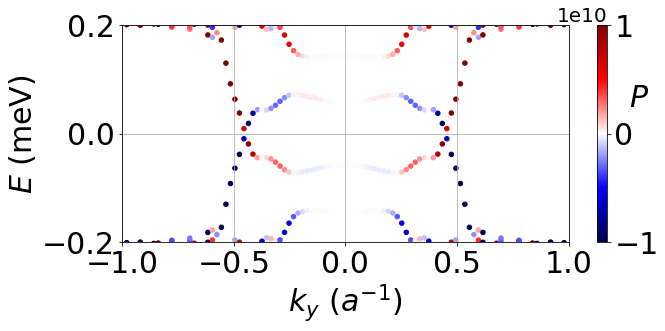

In [68]:
fig = plt.figure(figsize=(10,4))
norm = colors.TwoSlopeNorm(vcenter=0, vmin = -1*1e10, vmax = 1*1e10)
hbar_eV = sc.hbar/sc.eV
c_fact = 1/hbar_eV
plt.scatter(K_y_pi_1_15, E_k_y_1_15pi_B_1_real_params*1e3, s = 20, c=c_fact*velocity_k_y_for_1_15pi_B_1_real_params*K_y_pi_1_15, cmap="seismic", norm = norm)
cbar = plt.colorbar( orientation = "vertical", ticks = [-1.0*1e10, 0, 1.0*1e10])
plt.xlabel("$k_y\\ (a^{-1})$", fontsize=30)
plt.ylabel("$E$ (meV)", fontsize=30)
cbar.ax.tick_params(labelsize=30)
cbar.ax.yaxis.offsetText.set_fontsize(20) 
plt.text(1.27, 0.05, '$P$', fontsize=30)
plt.tick_params(labelsize=30)
plt.grid()
plt.ylim(-0.2,0.2)
plt.yticks([ -0.2, 0, 0.2]);
plt.xlim(-1,1)
plt.show()

## Figure 4(a)

In [70]:
def plot_all_k_y_Pol_el_new_pol_u_velocity(mu = 0, B = 1):
    L_N = 80
    L_SC = 2000
    W = 2000
    Delta_L = 0.2
    Delta_R = 0.2
    alpha = 50
    n_values = 40
    B = B
    mu = mu

    pyplot.figure(figsize=(10,8))
    norm = colors.TwoSlopeNorm(vcenter=0, vmin = -1*1e10, vmax = 1*1e10)
    phi_values = np.linspace(-2, 2, 400)*np.pi
    for phi in phi_values:
        k_y_values = np.linspace(-1, 1, 400)
        res_k_y_B = lview.map_async(lambda k_y: Polarisation_with_spin_for_wrapped_system(L_N = L_N, L_SC = L_SC, W = W,\
                                                                                          mu=mu*1e-3,Delta_L = Delta_L*1e-3,\
                                                                                          Delta_R = Delta_R*1e-3, \
                                                                                          alpha = alpha*1e-3, B = B, phi = phi,\
                                                                                          k_y = k_y, n_values = n_values),\
                                    k_y_values)
        energies_with_k_y_for_phi_B_scatter = res_k_y_B.get()
        E_pos = np.array(energies_with_k_y_for_phi_B_scatter)[0:,0:1, :].ravel()
        ky = np.repeat(k_y_values,40)
        velocity_k_y_for_phi_B_scatter = np.gradient(np.array(energies_with_k_y_for_phi_B_scatter)[:,0,:], axis = 0).ravel()
        phi_values_new = np.repeat(phi,16000)
        hbar_eV = sc.hbar/sc.eV
        c_fact = 1/hbar_eV
        pyplot.scatter(phi_values_new/np.pi, E_pos*1e3, s = 20, c= c_fact*velocity_k_y_for_phi_B_scatter*ky, cmap="seismic", norm = norm)
        

    cbar = pyplot.colorbar( orientation = "vertical", ticks = [-1.0*1e10, 0, 1.0*1e10])
    pyplot.ylim(-0.2,0.2)
    pyplot.yticks([ -0.2, 0, 0.2]);
    pyplot.xlim(-2.0, 2.0)
    pyplot.xlabel("$\phi\;(\pi)$", fontsize=30)
    pyplot.ylabel("$E$ (meV)", fontsize=30)
    cbar.ax.tick_params(labelsize=30)
    cbar.ax.yaxis.offsetText.set_fontsize(20)
    pyplot.text(2.65, 0.05, '$P$', fontsize=30)
    pyplot.tick_params(labelsize=30)
    pyplot.grid()
    pyplot.show()

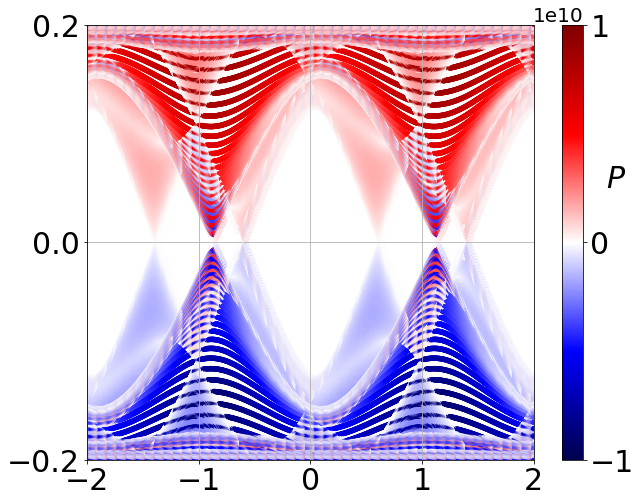

In [265]:
plot_all_k_y_Pol_el_new_pol_u_velocity(mu = 5, B = 1)

In [71]:
def En_analytical_spin(phi, B_plane, miu, Delta, T, spin, N):
    L = 80
    g = -50
    m = sc.m_e*0.014 
    def E_z(B_plane):
        miu_B_plane = (sc.e*sc.hbar)/(2*sc.m_e)
        return (g*miu_B_plane*B_plane)/2
    
    def Fermi_velo_term(miu):
        factor = sc.hbar*np.sqrt(2/m)
        return factor*np.sqrt(miu*sc.eV)
    
    phase_shift_spin = (phi/2) + spin*((E_z(B_plane)*L*1e-9)/Fermi_velo_term(miu))                                        
    return N*Delta*np.sqrt(1-T*np.sin(phase_shift_spin)**2)

In [72]:
phi_values = np.linspace(-4*np.pi, 4*np.pi, 200)

In [73]:
ABS_for_up_spin_pos = En_analytical_spin(phi = phi_values, B_plane = 0.5, Delta = 0.2*1e-3, miu = 5*1e-3, T = 1, spin = 1, N =1)
ABS_for_do_spin_pos = En_analytical_spin(phi = phi_values, B_plane = 0.5, Delta = 0.2*1e-3, miu = 5*1e-3, T = 1, spin = -1, N = 1)

## Polarisation (P) for spin component i.e $<\sigma_y\tau_{0}>$

In [74]:
%%px --local

sigma_0 = np.identity(2)
sigma_x = np.array([[0, 1], [1, 0]])
sigma_y = np.array([[0, -1j], [1j, 0]])
sigma_z = np.array([[1, 0], [0, -1]])
sigma_xsigma_z = np.array(np.kron(sigma_x,sigma_z))
sigma_ysigma_z = np.array(np.kron(sigma_y,sigma_z))
sigma_zsigma_z = np.array(np.kron(sigma_z,sigma_z))

def Polarisation_with_spin_comp(L_N, L_SC, W, mu, Delta, alpha, B, phi, n_values):
    class LuInv(sla.LinearOperator):
        def __init__(self, A):
            inst = kwant.linalg.mumps.MUMPSContext()
            inst.factor(A, ordering='metis')
            self.solve = inst.solve
            try:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype,
                                            matvec=self._matvec)
            except TypeError:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype)

        def _matvec(self, x):
            return self.solve(x.astype(self.dtype))

    n_eigs = n_values
    n_vec_lanczos = 3*n_values+10
    sigma=0.0
    
    sys_finite, sys_infinite = make_system(L_N = L_N, L_SC = L_SC,W=W)
    sysf = sys_finite.finalized()
    ham_mat = sysf.hamiltonian_submatrix(params=dict(mu = mu, Delta = Delta, alpha = alpha, B = B, phi = phi),\
                                         sparse=True)
    ev, evecs = sla.eigs(ham_mat, k=n_eigs, OPinv=LuInv(ham_mat), sigma=sigma, ncv=n_vec_lanczos)
    ev_sorting_indices = ev.argsort()
    ev = ev[ev_sorting_indices]
    evecs = np.array(evecs)[:,ev_sorting_indices]
    ee = np.real(ev)

    x = []
    y = []
    a = []
    b = [] 
    for ie, e in enumerate(np.array(ee)):

        wf_e_up = evecs[::4,ie]
        wf_h_do = evecs[1::4,ie]
        wf_e_do = evecs[2::4,ie]
        minus_wf_h_up = evecs[3::4,ie]

        ch_e_up = np.sum(np.abs(wf_e_up)**2)
        ch_h_do = np.sum(np.abs(wf_h_do)**2)
        ch_e_do = np.sum(np.abs(wf_e_do)**2)
        ch_h_up = np.sum(np.abs(minus_wf_h_up)**2)
        Q_e = (ch_e_up + ch_e_do)
        Q_h = (ch_h_up + ch_h_do)
        P = (Q_e - Q_h)/ (Q_e + Q_h)
       
        Avg_sigma_y_sigma_0 = -1j*np.sum(np.conj(wf_e_up)*wf_e_do)-1j*np.sum(np.conj(wf_h_do)*minus_wf_h_up)+1j*np.sum(np.conj(wf_e_do)*wf_e_up)+1j*np.sum(np.conj(minus_wf_h_up)*wf_h_do)
        Avg_sigma_x_sigma_0 = np.sum(np.conj(wf_e_up)*wf_e_do)+np.sum(np.conj(wf_h_do)*minus_wf_h_up)+np.sum(np.conj(wf_e_do)*wf_e_up)+np.sum(np.conj(minus_wf_h_up)*wf_h_do)
        
        x.append(e)
        y.append(P)
        a.append(Avg_sigma_y_sigma_0)
        b.append(Avg_sigma_x_sigma_0)
    
    return x,y,a,b

In [75]:
%%px --local

L_N = 80
L_SC = 2000
W = 2000
mu = 5
Delta = 0.2
alpha = 50
B = 0.5
n_values = 200

In [ ]:
phi_values2 = np.linspace( - 2*np.pi, 2*np.pi, 200)
res_phi_scatter_real_params_B_05 = lview.map_async(lambda phi: Polarisation_with_spin_comp(L_N = L_N, L_SC = L_SC, W = W, mu=mu*1e-3, Delta = Delta*1e-3, alpha = alpha*1e-3,\
                                         B = B, phi = phi, n_values = n_values), phi_values2)
res_phi_scatter_real_params_B_05.wait_interactive()

In [ ]:
with open('energies_with_phi_scatter_real_params_with_spin_comp_B_05.pkl', 'wb') as P_energies_with_phi_scatter_real_params_with_spin_comp_B_05:    
    pickle.dump(energies_with_phi_scatter_real_params_with_spin_comp_B_05, P_energies_with_phi_scatter_real_params_with_spin_comp_B_05)

In [76]:
with open('energies_with_phi_scatter_real_params_with_spin_comp_B_05.pkl', 'rb') as P_energies_with_phi_scatter_real_params_with_spin_comp_B_05:     
    Pickle_energies_with_phi_scatter_real_params_with_spin_comp_B_05 = pickle.load(P_energies_with_phi_scatter_real_params_with_spin_comp_B_05)

In [77]:
E_B_05 = np.array(Pickle_energies_with_phi_scatter_real_params_with_spin_comp_B_05)[0:,0:1, :].ravel()
Pol_B_05 = np.array(Pickle_energies_with_phi_scatter_real_params_with_spin_comp_B_05)[0:,1:2, :].ravel()
sig_y_sig_0_avg_B_05 = np.array(Pickle_energies_with_phi_scatter_real_params_with_spin_comp_B_05)[0:,2:3, :].ravel()
sig_x_sig_0_avg_B_05 = np.array(Pickle_energies_with_phi_scatter_real_params_with_spin_comp_B_05)[0:,3:4, :].ravel()

In [79]:
phi_values2 = np.linspace( - 2*np.pi, 2*np.pi, 200)

In [80]:
phase_real_params = np.repeat(phi_values2,200)

## Figure 2(a)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/axes/_axes.py:4322: ComplexWarning: Casting complex values to real discards the imaginary part
  c = np.asanyarray(c, dtype=float)
/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/collections.py:206: ComplexWarning: Casting complex values to real discards the imaginary part
  offsets = np.asanyarray(offsets, float)


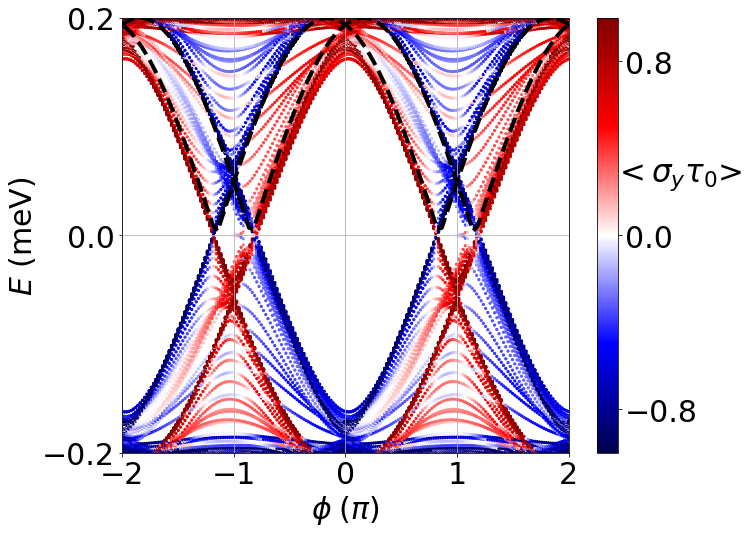

In [81]:
from matplotlib.colors import ListedColormap
fig = plt.figure(figsize=(10,8))
norm = colors.TwoSlopeNorm(vcenter=0)
plt.scatter(phase_real_params/np.pi, E_B_05*1e3, s = 5, c= sig_y_sig_0_avg_B_05, cmap="seismic", norm = norm)
cbar = plt.colorbar( orientation = "vertical", ticks=[-0.8, 0, 0.8])
plt.plot(phi_values/np.pi, ABS_for_up_spin_pos*1e3, "k--", linewidth=4)
plt.plot(phi_values/np.pi, ABS_for_do_spin_pos*1e3, "k--", linewidth=4)
cbar.ax.tick_params(labelsize=30)
plt.text(2.4, 0.05, r'$<\sigma_y\tau_{0}$>', fontsize=31)
plt.tick_params(labelsize=30)
plt.ylim(-0.2,0.2)
plt.xlim(-2,2)
plt.xlabel("$\phi\; (\pi)$", fontsize = 30)
plt.ylabel("$E$ (meV)", fontsize=30)
plt.yticks([-0.2, 0, 0.2]);
ax = plt.gca()
ax.grid(True)
plt.show()